# Stochastic Process Theories for Income Distribution
_By_ Alex Carrasco (January, 2021)

## Contents
- [Stochastic Process Theories](#Stochastic-Process-Theories-for-Income-Distribution)  
  - [Overview](#Overview)  
  - [Gibrat's law and log-normal distribution](#Gibrat's-law-and-log-normal-distribution)
  - [Power laws](#Power-laws)  

## Overview

**Empirical Regularity**. There are two key regulartities when we observed distributions within the field of economics:

> **Moments**. In contrast to physical and biological worlds, where distributions tend to be symmetric and bell-shaped, in social science, distributions tend to: **(i)** be skweed to the right (asymetric) and **(ii)** have fat tails (leptokurtic). For instance, mean income always exceed median earnings and the top percentiles of earners account for a strikingly disproportionate share of total earnings.

> **Power laws**. In its broadest sense, a power law is a relation of the type $\mathcal{P}=a x^\beta$, where $\mathcal{P}$ and $x$ are variables of interest, $\beta$ is the power law exponent, and $a$ is a constant. What is found in many distributions (not only in economics) is that the probability that a variable of interest $y$ is greater than $x$ is well-described by
$$\mathbb{P}(y>x)=a/x^\zeta$$
In economics, these empirical power laws are associated to patterns involving cities and firms (Zipf's law: $\zeta = 1$), stock markets ($\zeta= 3$), and income and wealth ($\zeta = 1.5,3$). For an excellent introduction of Zipf's law outside the field of economics see [this video](https://www.youtube.com/watch?v=fCn8zs912OE).

**Why is this important?** The study of income and wealth distributions is relevant due to the interactions of micro and macro in equilibrium analysis, redistributive policy, political economy, recent interest for monetary policy, etc. However, why stochastic theories? After all, it just points out that a certain process leads to a certain distribution and a social scientist will want to know the economics mechanism generating certain properties in distributions. The main reason for the relevance of stochastic theories is that once the basic statistical mechanisms are clarified, one can suggest good economic reasons as to why they might plaussibly exist.

**Notebook's Goal**. Although there are several economic theories explaining the main mechanisms behind the empirical regularties, in this notebook we focus in the stochastic process theories for _Income Distributions_ with the above-described properties. To do so, we consider the individual income $y$ as an stochastic variable which depends on several factors/shocks/increments $\epsilon_1,\dots,\epsilon_T$, i.e.,
$$ y = F(\epsilon_1,\dots,\epsilon_T)$$
Therefore, the goal is to determine a _generative mechanism_ (DGP for $\epsilon_1,\dots,\epsilon_T$ and an aggregator $F(.)$), such that, the distribution of $y$ satisfies the empirical findings.

**Numerical applications**. We use Julia to complement this revision and to visualize how an specific generative mechanism might fit the mentioned properties. As a first step, lets inialize the Julia kernel by activating the packages used through this notebook: 

In [1]:
using Statistics, Distributions, LinearAlgebra, Random, Plots, StatsPlots, SparseArrays, QuantEcon, Polynomials;

theme(:ggplot2);

@recipe function f(::Type{Val{:home}}, x,y,z)
       seriesalpha    := 0.3
       normalize      := true
       legendfontsize := 6
       seriestype     := :histogram
       x,y
end

## Gibrat's law and log-normal distribution
The basic mechanism for generating asymetries and fat tails in income distributions is the proportional growth which is based on the Gibrat's law. 

> _**Gibrat's law of proportional effect**: The growth process is independent of size._ 

Gibrat's law is usually stated in the analysis of firm's size as follows: _the probability of a given proportionate change in size during a specified period is the same for all firms in a given industry—regardless of their size at the beginning of the period_.

As a first approximation, we interpret $\epsilon_t$ as stochastic factors/shocks at a given year, i.e., $T$ is fixed and equal to the total number of these factors. Due the Central Limit Theorem (CLT), $F$ cannot have the form $\sum_{t=1}^T \epsilon_t$ with identical and independent distributed (i.i.d.) factors/shocks, otherwise $y$ would be symmetric and bell-shaped.  In 1931, influenced by the astronomer Jacobus Kapteyn, <span style="color:blue">Gibrat</span> postulated that the simplest process to generate skew distributions is 
$$ y =  F(\pmb{\epsilon}) = \prod_i^T \epsilon_i $$ 
with i.i.d $\epsilon_1,\dots,\epsilon_T$. That is,  if the small shocks are not additive but multiplicative, applying the CLT to log
size instead of size, one should obtain a lognormal distribution, which is skewed.  

In general, we can interpret $\epsilon_i$ as a income factor (e.g., skills, IQ, returns, hours worked, etc) or as income increments. If we interpreted it as gross increments, it becomes a theory of random/stochastic growth. 

>_**Random Growth Process**_: Note that, with a proper re-definition of objects, the Gibrat's generative mechanism is equivalent to having a _stochastic/random growth process_:
> $$ y_t = y_0 (1+\epsilon_1) (1+\epsilon_2) \dots (1+\epsilon_T) $$
> or,
> $$ \ln(y_t/y_0) \approx \epsilon_1 + \dots + \epsilon_T $$

Interestingly, we will see that wih a small change to the model, Gibrat's law of proportional growth actually becomes consistent with power laws (in particular, with Pareto distributions).

**I.I.D. FACTORS/INCREMENTS**. In the following exercise, we contrast the Gibrat's approach to the additive Laplacian approach for i.i.d. factors/shocks. It is evident that the Gibrat's approach implies swekness and fat tails for distribution, while, unsurprisingly, the summatory aggregator generates symmetric and bell-shaped distributions. 

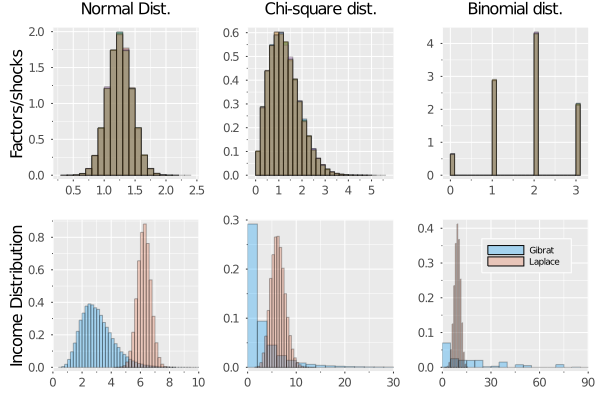

In [2]:
Random.seed!(123);

T    = 5;
S    = 100_000;

function gen_simul(dist; S=100, K=2)
    ϵ    = rand(dist,S,K);
    y    = prod(ϵ,dims=2);  
    x    = sum(ϵ,dims=2);
    return y,x,ϵ
end

leg     = ["Gibrat" "Laplace"];
dist    = (Normal(1.25,0.2), Chi(2), Binomial(3,0.6));
titles  = ["Normal Dist." "Chi-square dist." "Binomial dist."];
xlimits = ((0,10),(0,30),(0,90));
labels  = (:none, :none, leg);

gg    = plot(layout=(2,3));
for i in eachindex(dist)
    y,x,ϵ = gen_simul(dist[i],S=S,K=T);            # simulating    
    plot!(gg,ϵ,bin=30,label=false, st=:home,sp=i); # Factors/Shocks
    title!(titles[i], titlefontsize=11,sp=i);
    if i == 1; ylabel!("Factors/shocks",sp=i); end        
    
    plot!(gg,[y x],bin=[90 30],st=:home,sp=i+3,    # Income
         xlim=xlimits[i],label=labels[i],legend=(0.6,0.8)); 
    if i == 1; ylabel!("Income Distribution",sp=i+3); end
end
gg

There are two problems with the pure log-normal/Gibrat approach:

> 1. Such process implies ever growing variance in the overall distribution of log-earnings. Therefore, asumming $T\rightarrow \infty$, an stationary distribution of income does not exists.
> 2. Even if we take $T$ as fixed, observed income distributions tend to have tails that are thicker and longer than the log-normal. 

During 1950-1970s, various economists devised different auxiliary stabilizing hypothesis to offset the tendency for increasing variance and solves problem 1. On the other hand, problem 2 immediately discards log-normal distributions as plausible generative mechanism for income distributions. Other theories are needed to fit the upper tail of income distribution. We will return to these different theories below. 

**CORRELATED FACTORS/SHOCKS**. There is an easy way to account for the extra concentration of mass in the tail. Put simply, it just consists in letting the factors that generates income to be positive correlated. First, the following application performs the previous exercise but with correlated factors.

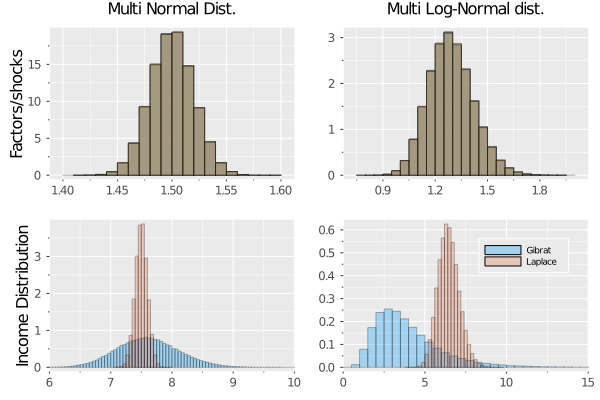

In [3]:
Random.seed!(123)
function gen_simul_corr(dist; S=100)
    ϵ    = rand(dist,S)';
    y    = prod(ϵ,dims=2);  
    x    = sum(ϵ,dims=2);
    return y,x,ϵ
end

A              = ones(T,T);  
A[diagind(A)] .= 0;
dist           = (MvNormal(1.5*ones(T), 0.02^2*I + 0.99*0.02^2*A), 
                  MvLogNormal(MvNormal(0.25*ones(T), 0.1^2*I + 0.99*0.1^2*A)));        

titles         = ["Multi Normal Dist." "Multi Log-Normal dist."];
xlimits        = ((6,10),(0,15));
labels         = (:none, leg);

gg    = plot(layout=(2,2));
for i in eachindex(dist)
    y,x,ϵ = gen_simul_corr(dist[i],S=S);            # Simulating    
    plot!(gg,ϵ,bin=30,label=false, st=:home,sp=i);  # Factors/Shocks
    title!(titles[i], titlefontsize=11,sp=i);
    if i == 1; ylabel!("Factors/shocks",sp=i); end        
    
    plot!(gg,[y x],bin=[90 30],st=:home,sp=i+length(titles),     # Income
         xlim=xlimits[i],label=labels[i],legend=(0.75,0.8)); 
    if i == 1; ylabel!("Income Distribution",sp=i+length(titles)); end
end
gg

Second, we examine the consequences on income distribution of negative and positive factors correlation. As expected, a positive correlation help us to account an extra mass in the upper tail of the income distribution.

In [4]:
Random.seed!(123);
leg      = ["Correl<0" "Correl=0" "Correl>0"];
## Incomes
y        = Matrix{Float64}(undef,S,3);
# Multinormal
y[:,1],  = gen_simul_corr( MvNormal(1.25*ones(T), 0.2^2*I - 0.24*0.2^2*A) , S=S); 
y[:,2],  = gen_simul_corr( MvNormal(1.25*ones(T), 0.2^2*I + 0.0*A) , S=S); 
y[:,3],  = gen_simul_corr( MvNormal(1.25*ones(T), 0.2^2*I + 0.99*0.2^2*A) , S=S);

g1       = histogram(y,bin=[100 100 500],label=false,xlim=(0,10),st=:home);
           title!("Income Distribution",titlefontsize=11);
           ylabel!("Multi Normal dist.");
g2       = boxplot(leg,y,legend=false,outliers=false,α=0.3);
           title!("Boxplot (no outliers)",titlefontsize=11);
g3       = boxplot(leg,y,legend=false,α=0.4,markersize=3);
           title!("Boxplot",titlefontsize=11);

# Multilognormal
y[:,1],  = gen_simul_corr( MvLogNormal(MvNormal(0.001*ones(T), 0.2^2*I - 0.24*0.2^2*A)) , S=S); 
y[:,2],  = gen_simul_corr( MvLogNormal(MvNormal(0.001*ones(T), 0.2^2*I + 0.0*A)) , S=S); 
y[:,3],  = gen_simul_corr( MvLogNormal(MvNormal(0.001*ones(T), 0.2^2*I + 0.99*0.2^2*A)) , S=S);

g4       = histogram(y,bins=[50 50 1000],label=leg,legend=(0.6,0.8),xlim=(0,5),st=:home);
           ylabel!("Multi Log-Normal dist.");
g5       = boxplot(leg,y,legend=false,outliers=false,α=0.3);
g6       = boxplot(leg,y,legend=false,α=0.4,markersize=3);

plot(g1,g2,g3,g4,g5,g6,layout=(2,3))

Third, we illustrate the example of correlated increments given in <span style="color:blue">Neal and Rosen (2000, Section 1)</span>. Consider a statistical factor-analytic structure with a single factor $1+\lambda$ (e.g., IQ) and suppose that personal endowments of the specific $\epsilon$-inputs follow $\epsilon_i=u_i(1+\lambda)$, where $u_i$ is independently distributed. Then, the productory aggregator implies that the personal income is $y= (1+\lambda)^K\prod_{i=1}^Ku_i$.

The exercise below shows that (even) if $1+\lambda$ is symmetric and normally distributed, together with $u_i$ being uniformly distributed, the distribution of $y$ has a long right tail. Moreover, it shows that, within this factor model, the single factor is necessary in order to generate that extra concentration in the upper tail. 

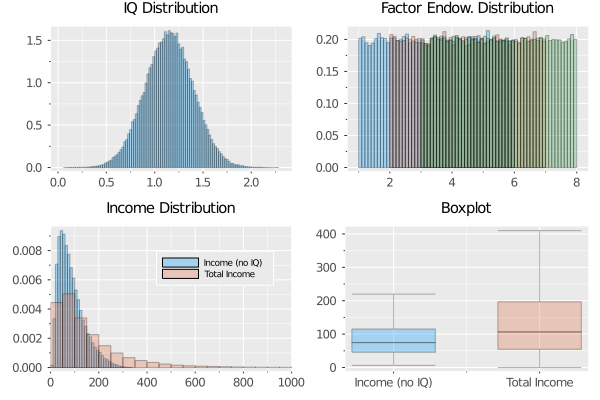

In [6]:
T      = 3;

# [1] Incomes
lambda = 0.15 .+ 0.25*randn(S);
u      = rand(Product(Uniform.([0+i for i in 1:T],[5+i for i in 1:T])),S)';
x      = prod(u,dims=2);
y      = x .*(1 .+ lambda).^T;

# [2] Graphs
leg    = ["Income (no IQ)" "Total Income"];

g1     = histogram(1 .+ lambda,label=false,st=:home,title="IQ Distribution",titlefontsize=10);
g2     = histogram(u,label=false,st=:home,title="Factor Endow. Distribution",titlefontsize=10);
g3     = histogram([x y],bins=[40 100],st=:home,label=leg,title="Income Distribution",titlefontsize=10,xlim=(0,1000));
g4     = boxplot(leg,[x y],α=0.3, label=false,outliers=false,title="Boxplot",titlefontsize=10);

plot(g1,g2,g3,g4,layout=(2,2))

**STATIONARY DISTRIBUTION**. When we consider $\epsilon_i$ as income increments along time, it is natural to expect a growing number of factors generating income at any point of time. As we already stated, the main problem with this wiew is that there is no stationary income distribution for the corresponding generative mechanism. Therefore, we need add new devices to offset the growing variance of the base model.

_**Ruthenford's model**_. To obtain a distribution with the observed characteristics, <span style="color:blue">Ruthenford (1955)</span> introduces "birth" and "death" processes to the Gibrat's approach. Although the main contribuion of Ruthenford was to analytically characterize the distribution of earnings in a more general setting, in this notebook we focus in a simple model and numerical application.

In any given year, there is a stream of $N(0)>0$ new entrants with same age (say $20$) and life expectancy $1/\varrho$. The initial income power, i.e. $\ln y$, of these new entrants follows a normal distribution. In addition, the mortality rate $\varrho$ is  independent to income power and age. With this assumptions, the age composition in this economy is given by the exponential survival function, i.e., the _number_ of individuals aged $s+20$ is
$$g(s) = N(0) \exp(\varrho s)$$

Furthermore, every year individuals experience independent random increments in their income. Note that the mortality rate controls the upper tail of the income by limiting the feasible number of income increments and positive fertility permits the existence of a constant flow of individuals. The following numerical exercise shows how this "birth" and "death" processes help to stationarize the income distribution. To do so, we compare a society in which the life expectancy (LEx) is equal to 20 (+20) versus another in which the LEx is equal to 45 (+20). 

In [7]:
Random.seed!(123);

## [0] Parameters
N_0   = 2500; 
T     = 250; 
LEx   = [20 45];

## [1] Income Distribution per age
init  = exp.(1 .+ 0.33*randn(N_0));       # Initial
ϵ     = rand(Uniform(0.95,1.11),N_0,T-1); # Increments
y     = [init init.*cumprod(ϵ,dims=2)];   # Incomes

## [2] Age Distribution
ϱ     = 1 ./ LEx;
Gt    = exp.(-(0:T-1)*ϱ);
ind   = falses(N_0,T,length(ϱ));

for k in eachindex(ϱ)
    ind[:,1,k] .= true;
    ind_        = 1:N_0;
    for i in 2:T
        Nprev          = sum(ind[:,i-1,k]);     
        ind_           = ind_[rand(Bernoulli(1-ϱ[k]),Nprev)];
        ind[ind_,i,k] .= true;    
    end
end
Ge     = reshape(sum(ind,dims=1),:,2);

## [4] Graphs
l        = @layout [b{0.33h}
                   grid(2,2)];

age_plot = 1:20:61;
age_lab  = ["$(19+i)" for i in age_plot'];

p0  = histogram(y[ind[:,:,1]] ,label="LEx=$(LEx[1])",st=:home);
      histogram!(y[ind[:,:,2]],label="LEx=$(LEx[2])",st=:home);
      title!("Full Income Distribution",titlefontsize=10);
      xlims!((0,40));

p1  = histogram(y[:,age_plot],label="age ".*age_lab,st=:home,bins=75,legend=(0.8,0.8));
      title!("Income Dist. by age (I)",titlefontsize=10);
      xlims!((0,50));

p2  = boxplot(age_lab, y[:,age_plot],α=0.3,label=false);
      title!("Income Dist. by age (II)",titlefontsize=10);

p3  = bar(Ge,label=["LEx=$i" for i in LEx],α=0.2,legend=(0.75,0.8),legendfontsize=6);      
      plot!(N_0*Gt,lw=2,label=false,c=[RGB(0.2,0.2,0.75) RGB(0.75,0.2,0.2)]);
      title!("Age distribution", titlefontsize=10);
      xlims!((0,80));

p4  = boxplot(reshape(["LEx=$(LEx[1])"],1,1),y[ind[:,:,1]],α=0.3,legend=:none,outliers=false);
      boxplot!(reshape(["LEx=$(LEx[2])"],1,1),y[ind[:,:,2]],α = 0.3,outliers=false);
      title!("Full Income Boxplot",titlefontsize=10);

plot(p0,p1,p2,p3,p4,layout=l)

_**Champernowne's model**_. In 1953, <span style="color:blue">Champernowne</span> established a basic method for offsetting an increasing income variance. He replaced the random walk process with a Markov chain where workers face identical, fixed transition probabilities of moving between exogenously defined (log) earnings intervals. Like in the previous model, we only give a numerical application of Champernowne's main results.  

Champernowne controled the variance of earnings over time by restricting the average transition to be downward, toward lower incomes. For example, a rich man's income must be allowed some risk through misadventure of being degraded to a lower range; but the incomes in the lowest range cannot be allowed this possibility. Then, he absolute changes in income are liable to be much higher for incomes of USD 1,000,000 than for incomes of USD 100, so that the ranges must have a greater absolute width for high than for low incomes if our simplification is to have any plausibility.

Consider a stationary Markov Chain with states in $\mathcal{S}$ and stochastic matric $P$. Assume there exists $n$, such that for every state $j \in \mathcal{S}$:
\begin{equation}  P(j,j+u) = \begin{cases} 0 & \text{if} \; u>1 \; \text{or} \; u < -n \\ 
p_u & \text{if} \; -n\leq u \leq 1 \; \text{and} \; u > -n \end{cases} \end{equation}
with $\sum_{u=-n}^1 p_u =1$. Moreover, to ensure that the process is not dissipative, we assume that $g'(1):=-\sum_{u=-n}^1 up_u>0$ where $g(z):=\sum_{u=-n}^1 p_u z^{1-u}-z$. We can show that the ergodic distribution for such a Markov Chain is a power law. In fact, the stationary distribution is a solution for the difference equation $ \psi(j) = \sum_{u=-n}^1 p_u \psi(j-u)$, and is given by
$$\psi(j) = (1-b)b^j$$
where $b$ is the real positive root other than unity of $g(z)$. Finally, assuming a plaussible construction of the income intervals, Champernowne showed that the logarithm of the number of incomes exceeding $y$ is a linear function of $y$, i.e., the current process generates a distribution with one Pareto tail.

Although power laws fit quite well the upper tail of earnings income, Champernowne studied different relaxations to obtain a more realistic two-tailed income distributions obeying Pareto's law. One can find astonishing that a simple specific form of Champernowne's restriction implies Pareto's law as the stationary distribution, but he recogenized that this result relies on the fact that the prospects of a given proportionate changes of income  remain constant through time at each income level.

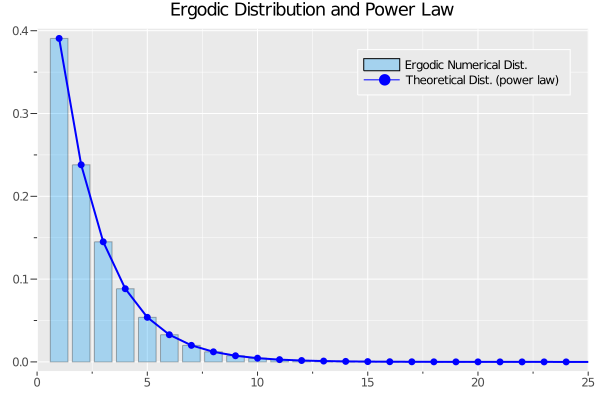

In [8]:
Random.seed!(123);

N    = 100; # Number of income intervals
n    = 5;   
p    = rand(n+1);
p_1  = 0.50;
p    = [(1-p_1)*p/sum(p); p_1];    
rr   = abs.(roots(Polynomial([p[end]; p[end-1]-1; p[end-2:-1:1]])));
b    = minimum(rr[rr .< 1]);

# Stochastic matrix
P    = zeros(N,N);
for i in 1:N-1
    if i <= n
        P[i,1:i+1] = [sum(p[1:n+2-i]) p[n+3-i:n+2]'];
    else
        P[i,i-n:i+1] = p';
    end
end
P[end,end-n:end] = [p[1:n]' sum(p[n+1:n+2])];
P  = sparse(P);

# Markov Chain (from QuantEcon package)
mc = MarkovChain(P);
ψ  = stationary_distributions(mc)[1];

# Graph
bar(ψ, α=0.3,label="Ergodic Numerical Dist.");
plot!((1 .- b) .* b.^(0:N-1),lw=2,c="blue",label="Theoretical Dist. (power law)",markershape=:circle,xlim=(0,25));
title!("Ergodic Distribution and Power Law",titlefontsize=12)

## Power laws
Since <span style="color:blue">Pareto (1896)</span>, it has been well known that the upper tail of the income distribution follows a power law. According to <span style="color:blue">Gabaix (2016)</span>, this is one of the few quantitative nontrivial _laws_  in economics that hold across time and countries. In this section, we review the relation between random growth model and Pareto distributions.

As Champernowne showed the random growth process is consistent with power laws. In fact, <span style="color:blue">Gabaix (2009)</span> suggests that if there is a lower bound on $y$, so that $y$ cannot go below a given threshold, it turns out that Gibrat's approach yields a steady-state distribution and it is a power law with some exponent $\zeta$ that depends on the details of the growth process. The simplest way to show this relationship is with the geometric Brownian motion (GBM):
$$d\ln y_t = (g-\sigma^2/2)dt + \sigma dB_t$$
where $g$ is the expected growth rate, $\sigma >0$ is the volatility, and $B_t$ is a standard Brownian motion that is independent across units. Then, given an initial $y_0$, and consistent with Gibrat's approach, the cross sectional distribution is log-normal
$$\ln(y_t/y_0) \sim \mathcal{N}\left((g-\sigma^2/2)t, \sigma^2 t \right)$$
Now, suppose there exists a threshold $x_{min}>0$ and that $g<0$. Then it is known (see  <span style="color:blue">Gabaix (2009)</span>) that the system converges to the unique stationary Pareto tail distribution
$$\mathbb{P}(y>x)=\left( \frac{x}{x_{min}} \right)^{-\zeta}$$ 
with $\zeta = 1 - 2g/\sigma^2>1$. 

<span style="color:blue">Akhundjanov and Toda (2019)</span> explain the success of the Gibrat's approach by the data used in Gibrat's book (characterized by data binning and truncation) and the implementation of graphical techniques rather than a more formal analysis. They revisit the original 24 datasets considered by Gibrat and showed that, in the majority of cases, the Pareto distribution provides a better fit to the data than the log-normal. However, it is undeniable that lognormal distribution is a good first approximation to the upper tail behavior in income distributions. The following exercise illustrates the similarities between Pareto and log-normal.

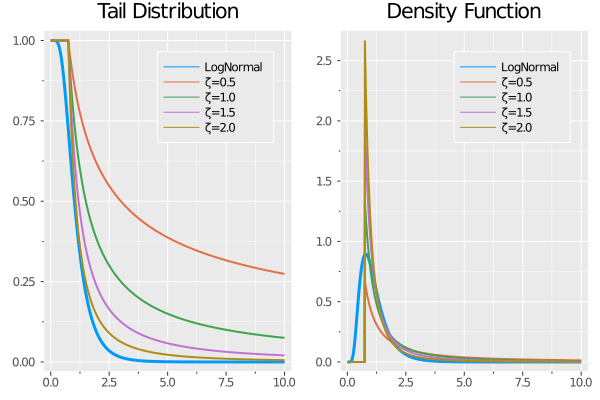

In [9]:
μ,v   = 0.01, 0.5;
LN    = LogNormal(μ,v);   

ζ     = 0.5:0.5:2.0;        
x_min = 0.75;
x_g   = 0:0.01:10;

g1    = plot(x_g, 1 .- cdf.(LN,x_g),lw=3,lab="LogNormal");
        title!("Tail Distribution");
for i in eachindex(ζ)
    plot!(x_g, 1 .- cdf.( Pareto(ζ[i],x_min),x_g),lw=2,lab="ζ=$(ζ[i])");
end

g2    = plot(x_g, pdf.(LN,x_g),lw=3,lab="LogNormal");
        title!("Density Function");
for i in eachindex(ζ)
    plot!(x_g, pdf.( Pareto(ζ[i],x_min),x_g),lw=2,lab="ζ=$(ζ[i])");
end

plot(g1,g2,layout=(1,2))